In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
df = sns.load_dataset('iris')  # use seaborn to load the iris data

In [3]:
df.species = pd.Categorical(df.species)
df.species.dtype

CategoricalDtype(categories=['setosa', 'versicolor', 'virginica'], ordered=False)

In [4]:
df['num_label'] = df.species.cat.codes

# Based on Matplotlib 

## Matplotlib  ᗒ ͟ʖᗕ

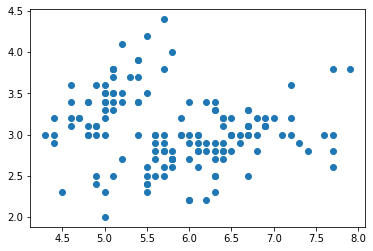

In [5]:
plt.scatter(df.sepal_length, df.sepal_width)

add some color

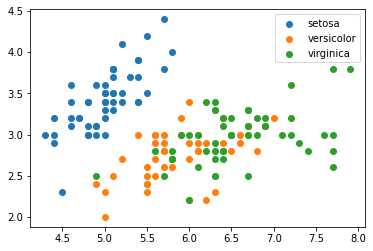

In [6]:
fig = plt.figure()
ax = fig.add_subplot(111)
for sp in df.species.unique():
    x = df[df.species==sp]['sepal_length']
    y = df[df.species==sp]['sepal_width']
    ax.scatter(x, y, label=sp)
ax.legend()

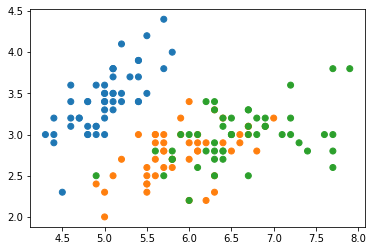

In [7]:
pallette = dict(zip(df.species.unique(), ['C0', 'C1', 'C2']))
colors = df.species.map(pallette)
plt.scatter(df.sepal_length, df.sepal_width, c=colors)

### add size

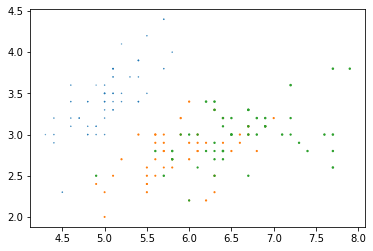

In [8]:
plt.scatter(df.sepal_length, df.sepal_width, c=colors, s=df.petal_width)

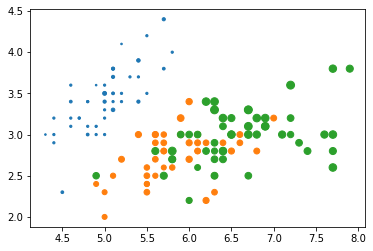

In [9]:
# multiply to get the desired effect
plt.scatter(df.sepal_length, df.sepal_width, c=colors, s=df.petal_width*25)

## Pandas  ಠ_ಠ

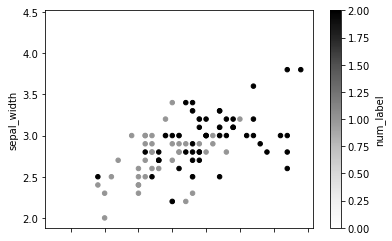

In [10]:
df.plot.scatter('sepal_length', 'sepal_width', c='num_label')
# pandas doesn't get that this is a category

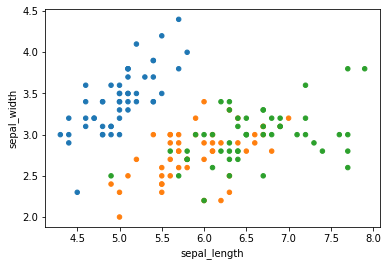

In [11]:
# using the previously defined color list
df.plot.scatter('sepal_length', 'sepal_width', c=colors) 

### size

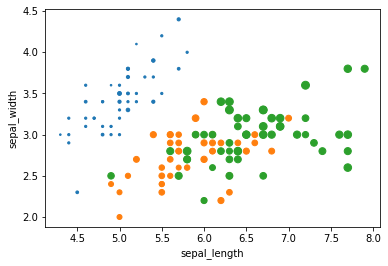

In [12]:
# using the previously defined color list
df.plot.scatter('sepal_length', 'sepal_width',s=df.petal_width*25, c=colors) 

## Seaborn  (∩ ͡° ͜ʖ ͡°)⊃━☆ﾟ.*

High level powerful statistical charts build on matplotlib!

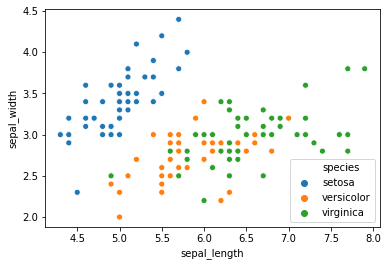

In [13]:
sns.scatterplot('sepal_length', 'sepal_width', data=df, hue='species')

Seaborn is easy:

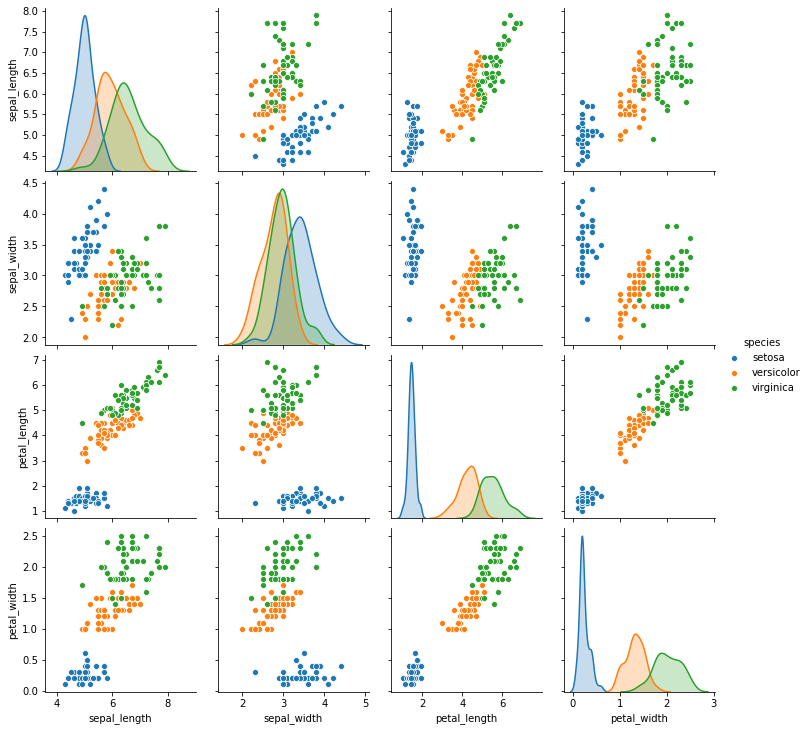

In [14]:
sns.pairplot(df.drop('num_label', axis=1), hue='species')

# Interactive libraries!

Set of libraries that have a JS backend and can render interactively on the notebook (since it accepts HTML)

# Altair

New promising declarative plotting lib based on Vega (JavaScript)

In [15]:
import altair as alt

In [16]:
alt.Chart(df).mark_circle().encode(
    alt.X('sepal_length', scale=alt.Scale(zero=False)),
    alt.Y('sepal_width', scale=alt.Scale(zero=False, padding=1)),
    color='species'
)

alt.Chart(...)

In [17]:
alt.Chart(df).mark_circle().encode(
    alt.X('sepal_length', scale=alt.Scale(zero=False)),
    alt.Y('sepal_width', scale=alt.Scale(zero=False, padding=1)),
    color='species',
    size='petal_width'
)

alt.Chart(...)

In [18]:
alt.Chart(df).mark_circle().encode(
    alt.X('sepal_length', scale=alt.Scale(zero=False)),
    alt.Y('sepal_width', scale=alt.Scale(zero=False, padding=1)),
    color='species',
    size='petal_width'
    ).interactive()

alt.Chart(...)

### Tooltips!

In [20]:
alt.Chart(df).mark_circle().encode(
    alt.X('sepal_length', scale=alt.Scale(zero=False)),
    alt.Y('sepal_width', scale=alt.Scale(zero=False, padding=1)),
    color='species',
    size='petal_width',
    tooltip='species'
    ).interactive()

alt.Chart(...)

# Bokeh 

In [21]:
from bokeh.io import output_notebook, show
output_notebook()

Loading BokehJS ...

In [22]:
from bokeh.plotting import figure
colormap = {'setosa': 'red', 'versicolor': 'green', 'virginica': 'blue'}
colors = [colormap[x] for x in df['species']]

p = figure(title = "Iris Morphology")
p.xaxis.axis_label = 'Petal Length'
p.yaxis.axis_label = 'Petal Width'

p.circle(df["petal_length"], df["petal_width"],
         color=colors, fill_alpha=0.2, size=10)

show(p)

# Plotly

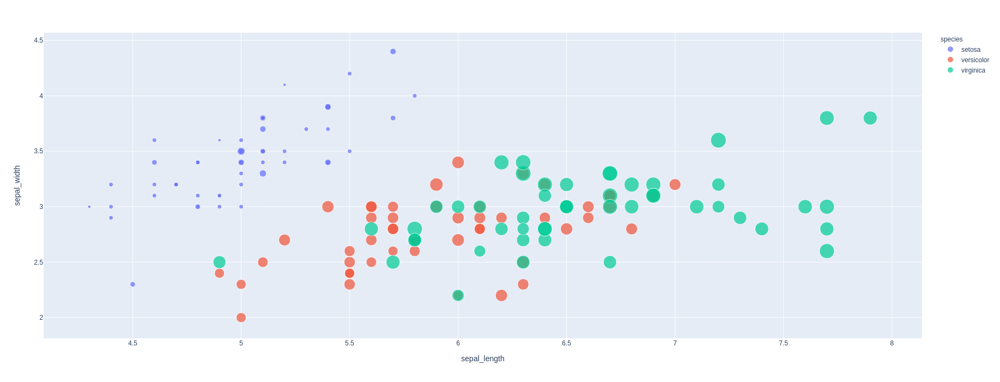

In [48]:
import plotly.express as px'sepal_length', y='sepal_width', color='species', size='petal_width', height=700, width=1000)
fig.show()

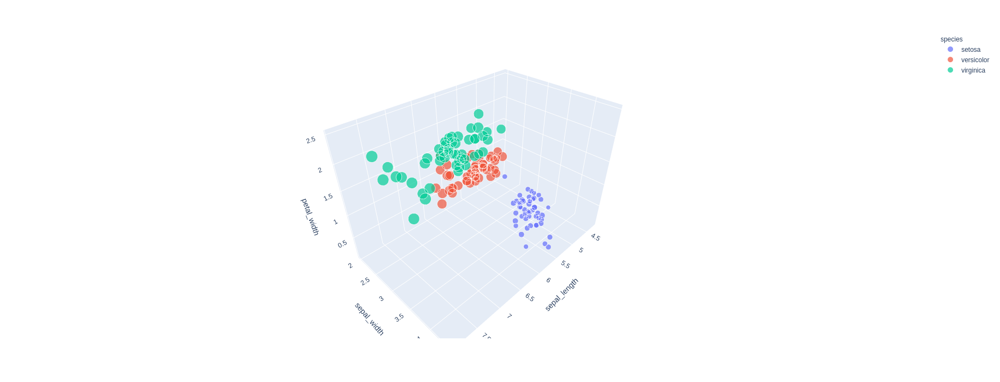

In [51]:
fig = px.scatter_3d(
    df,
    x='sepal_length',
    y='sepal_width',
    z='petal_width',
    color='species',
    size='petal_length',
    height=700,
    width=1000,
)
fig.show()

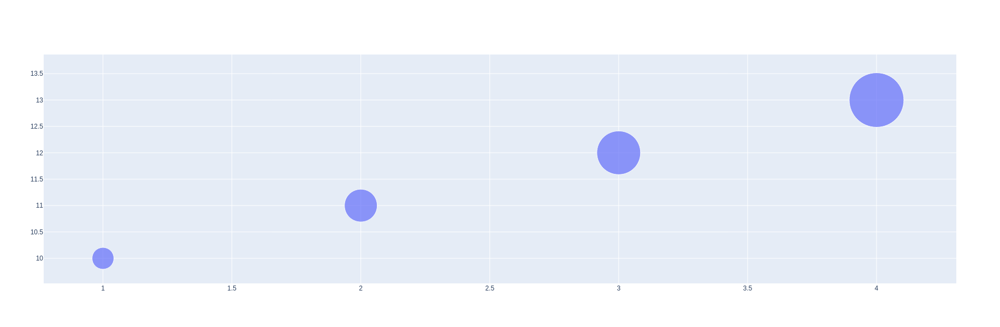

In [47]:
import plotly.graph_objs as go

trace0 = go.Scatter(
    x=[1, 2, 3, 4],
    y=[10, 11, 12, 13],
    mode='markers',
    marker=dict(
        size=[40, 60, 80, 100],
    )
)

data = [trace0]
layout = go.Layout(
    showlegend=False,
    height=600,
    width=600,
)

fig = go.Figure(data, layout)
fig.show()

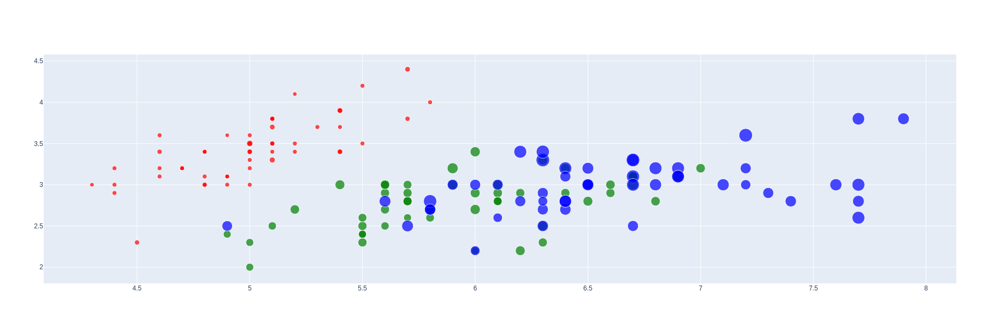

In [67]:
import plotly.graph_objs as go

trace0 = go.Scatter(
    x=df['sepal_length'],
    y=df['sepal_width'],
    mode='markers',
    marker=dict(
        size=(df['petal_width']+1)*7,
        color=colors
    )
)

data = [trace0]
layout = go.Layout(
    showlegend=False,
    height=600,
    width=600,
)

fig = go.Figure(data, layout)
fig.show()

# High perfomance plotting

Plotly with WebGL (uses the GPU)

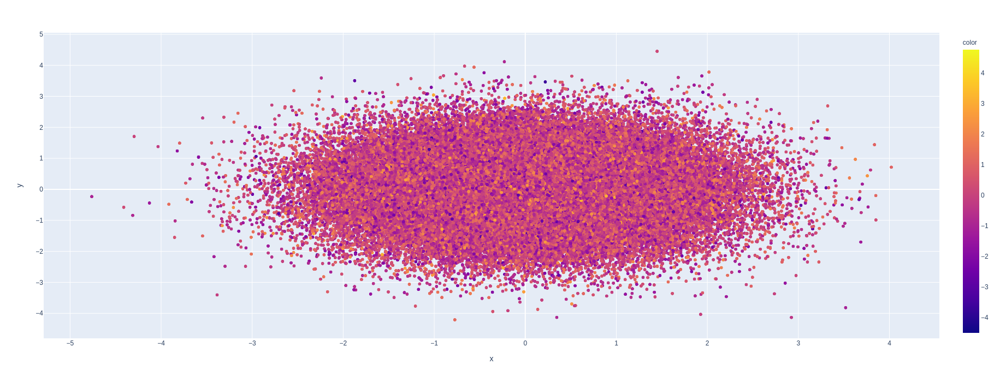

In [74]:
N = 100000
px.scatter(x=np.random.randn(N), y=np.random.randn(N), color=np.random.randn(N), height=700, width=1000, render_mode='webgl')

# [datashader](https://datashader.org/)